In [1]:
import os
import pandas as pd
import numpy as np

from datetime import datetime

import pyreadstat as prs

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import uniform, randint

from sklearn import preprocessing
from sklearn.metrics import auc, roc_curve, roc_auc_score, accuracy_score, confusion_matrix, plot_confusion_matrix
from sklearn.model_selection import RepeatedKFold, RepeatedStratifiedKFold, cross_val_score, GridSearchCV, KFold, RandomizedSearchCV, train_test_split

from skopt import BayesSearchCV

import xgboost as xgb

In [2]:
import sklearn
sklearn.__version__

'0.23.2'

In [3]:
os.chdir("/home/pchabets/Dropbox/STRESS_INDEX/")

In [4]:
# timer function, copied from https://www.kaggle.com/tilii7/hyperparameter-grid-search-with-xgboost
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [5]:
#proteomics
prtm = pd.read_csv("data/blood_and_saliva_variables/W1/proteomics/output/proteomics_replaced_outliers.csv")
prtm = prtm.drop('applate', axis=1)

In [6]:
#label data
y = pd.read_spss("data/outcome_groups/DSM_groups.sav", convert_categoricals=True)
y = y.drop('Remitted_comorbid', axis=1)
y = y.rename(columns={'pident':'Pident'})
y['Pident'] = y['Pident'].astype(int)

In [7]:
whole_set = pd.merge(y, prtm, how='inner', on='Pident')

In [8]:
whole_set

,Pident,Remitted_depression,ap6Ckine,apAPN,apAgRP,apAldRed,apAACT,apAAT,apA1Micr,apA1Macr,...,apVEGFC,apVEGFD,apVEGFR1,apVEGFR2,apVEGFR3,apVDBP,apVKDPS,apVN,apVWF,apYKL40
0,100012,non-remitted,325,1.6,113,14.0,713,2.2,11.0,2.5,...,36.0,433.0,455,11.0,76.0,419.0,16.0,2380,93.0,32.0
1,100047,remitted,508,4.5,113,8.2,581,1.1,9.5,1.5,...,30.0,433.0,455,7.6,15.0,107.0,13.0,1300,31.0,17.0
2,100053,remitted,548,3.9,113,12.0,768,1.9,5.3,1.5,...,NaN,NaN,455,8.4,64.0,410.0,19.0,1510,54.0,28.0
3,100068,non-remitted,547,6.1,113,13.0,982,2.1,17.0,1.7,...,41.0,433.0,455,6.7,48.0,273.0,17.0,2150,30.0,108.0
4,100084,non-remitted,430,3.3,113,14.0,768,1.4,12.0,1.7,...,45.0,433.0,455,7.9,50.0,274.0,19.0,2010,43.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,330160,remitted,822,3.6,113,5.8,561,1.4,6.8,1.8,...,35.0,433.0,455,4.6,29.0,190.0,11.0,1840,42.0,20.0
607,330171,remitted,435,5.1,113,11.0,947,2.2,8.8,1.9,...,45.0,433.0,455,8.7,29.0,244.0,14.0,2340,35.0,21.0
608,330221,remitted,673,3.4,113,9.1,663,1.9,12.0,1.9,...,31.0,433.0,455,5.9,33.0,251.0,16.0,1830,39.0,17.0
609,330284,remitted,675,6.6,113,5.2,666,1.4,10.0,1.5,...,49.0,565.0,455,6.6,39.0,137.0,16.0,2300,26.0,42.0


In [9]:
#Turn labels into 0's and 1's: non-remitted = 0, remitted = 1
from sklearn.preprocessing import LabelEncoder
lbl = LabelEncoder() 
whole_set['Remitted_depression'] = lbl.fit_transform(whole_set['Remitted_depression']) 

In [10]:
X = whole_set.drop(['Pident','Remitted_depression'], axis=1)
y = whole_set.pop('Remitted_depression')

### log10 transform data, can be done before train/test split because pointwise operation

In [11]:
X = np.log10(X) 

##### optional:  binarize analytes with > 90% lowest values (below detection limit values), using whole dataframe

In [12]:
# X = X.apply(
#     lambda x: (x.apply(lambda y: 0 if y==min(x) else 1)) if sum(x==min(x))/whole_set.shape[0] > 0.9 else x
# )

In [13]:
X

,ap6Ckine,apAPN,apAgRP,apAldRed,apAACT,apAAT,apA1Micr,apA1Macr,apAFP,apAR,...,apVEGFC,apVEGFD,apVEGFR1,apVEGFR2,apVEGFR3,apVDBP,apVKDPS,apVN,apVWF,apYKL40
0,2.511883,0.204120,2.053078,1.146128,2.853090,0.342423,1.041393,0.397940,-0.193820,2.428135,...,1.556303,2.636488,2.658011,1.041393,1.880814,2.622214,1.204120,3.376577,1.968483,1.505150
1,2.705864,0.653213,2.053078,0.913814,2.764176,0.041393,0.977724,0.176091,-0.259637,2.428135,...,1.477121,2.636488,2.658011,0.880814,1.176091,2.029384,1.113943,3.113943,1.491362,1.230449
2,2.738781,0.591065,2.053078,1.079181,2.885361,0.278754,0.724276,0.176091,-0.070581,2.428135,...,NaN,NaN,2.658011,0.924279,1.806180,2.612784,1.278754,3.178977,1.732394,1.447158
3,2.737987,0.785330,2.053078,1.113943,2.992111,0.322219,1.230449,0.230449,0.322219,2.428135,...,1.612784,2.636488,2.658011,0.826075,1.681241,2.436163,1.230449,3.332438,1.477121,2.033424
4,2.633468,0.518514,2.053078,1.146128,2.885361,0.146128,1.079181,0.230449,0.204120,2.998259,...,1.653213,2.636488,2.658011,0.897627,1.698970,2.437751,1.278754,3.303196,1.633468,1.301030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
606,2.914872,0.556303,2.053078,0.763428,2.748963,0.146128,0.832509,0.255273,0.000000,2.428135,...,1.544068,2.636488,2.658011,0.662758,1.462398,2.278754,1.041393,3.264818,1.623249,1.301030
607,2.638489,0.707570,2.053078,1.041393,2.976350,0.342423,0.944483,0.278754,-0.244125,2.428135,...,1.653213,2.636488,2.658011,0.939519,1.462398,2.387390,1.146128,3.369216,1.544068,1.322219
608,2.828015,0.531479,2.053078,0.959041,2.821514,0.278754,1.079181,0.278754,0.361728,2.428135,...,1.491362,2.636488,2.658011,0.770852,1.518514,2.399674,1.204120,3.262451,1.591065,1.230449
609,2.829304,0.819544,2.053078,0.716003,2.823474,0.146128,1.000000,0.176091,0.556303,2.428135,...,1.690196,2.752048,2.658011,0.819544,1.591065,2.136721,1.204120,3.361728,1.414973,1.623249


### Corr plot

<AxesSubplot:>

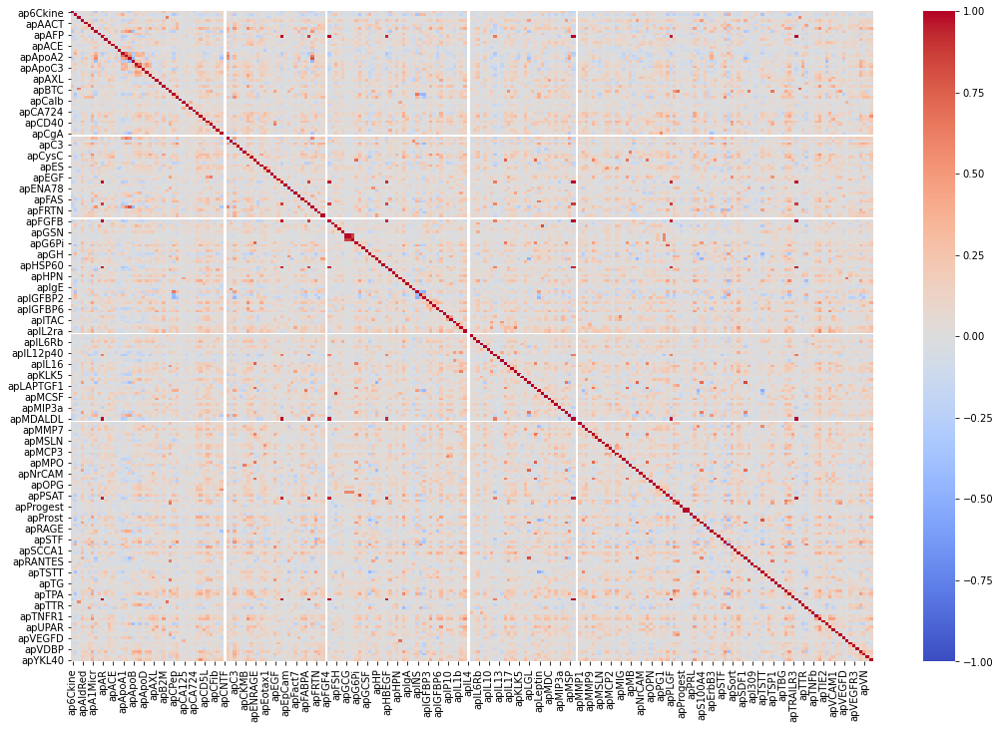

In [14]:
plt.figure(figsize = (18,12))
sns.heatmap(X.corr(), cmap='coolwarm', vmin=-1, vmax=1) 

### train-test split (80-20)

In [14]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101, shuffle=True)

### Preprocessing: remove zero-variance variables and impute NaN's with median

In [15]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import SimpleImputer

#### Select ZV columns from trainings data and remove them from train + test X

In [16]:
selector = VarianceThreshold()
selector.fit(X_train)

VarianceThreshold()

In [17]:
#Store variable names for later conversion back to dataframe
X_names = list(X_train.columns[selector.get_support()])

In [18]:
X_train = selector.transform(X_train)
X_test = selector.transform(X_test)

In [19]:
print(str(X.shape[1]-X_train.shape[1]) + " analytes with zero variance")

5 analytes with zero variance


#### Calculate median for each column in train X, and replace NaNs with that value in both train and test X

In [20]:
imputer = SimpleImputer(strategy="median")

In [21]:
imputer.fit(X_train)

SimpleImputer(strategy='median')

In [22]:
X_train = imputer.transform(X_train)
X_test = imputer.transform(X_test)

In [23]:
# Convert back to dataframe
X_train = pd.DataFrame(data=X_train,columns=X_names) 
X_test = pd.DataFrame(data=X_test, columns=X_names)

### Model
Bayesian optimization of hyperparameter tuning is used. Code was adapted from https://www.kaggle.com/nanomathias/bayesian-optimization-of-xgboost-lb-0-9769

In [24]:
#set number of parallel jobs to execute with the Bayes Search
N_JOBS = 14

In [25]:
#set number of iterations of search job
ITERATIONS = 1000

For more info on hyperparameters: see https://xgboost.readthedocs.io/en/latest/parameter.html

In [26]:
# Classifier
bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        booster = 'gbtree',
        eval_metric = 'auc', 
        use_label_encoder=False,
        verbosity=1
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 16, 'uniform'),
        'max_depth': (1, 6, 'uniform'),
#         'max_delta_step': (0, 1),
        'subsample': (0.5, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
#         'colsample_bylevel': (0.01, 1.0, 'uniform'),
#         'colsample_bynode': (0.01, 1.0, 'uniform'),
#         'reg_lambda': (1e-9, 1000.0, 'log-uniform'),
#         'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (0.01, 3.0, 'log-uniform'),
        'n_estimators': (50, 1000, 'uniform')
    },    
    cv = RepeatedKFold(
        n_splits=10, 
        n_repeats=10, 
        random_state=42
    ),
    n_jobs = N_JOBS,
    n_iter = ITERATIONS,   
    verbose= 3,
    random_state = 42,
    refit = True    
)

In [27]:
def status_print(optim_result):
    """Status callback during bayesian hyperparameter search"""
    
    # Get all the models tested so far in DataFrame format
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)    
    
    # Get current parameters and the best parameters    
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(
        len(all_models),
        np.round(bayes_cv_tuner.best_score_, 4),
        bayes_cv_tuner.best_params_
    ))

### Fit the model

In [ ]:
#fit the model
start_time = timer(None) 
fitted_model = bayes_cv_tuner.fit(X_train, y_train, callback=status_print)
timer(start_time)

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #1
Best ROC-AUC: 0.56
Best params: OrderedDict([('colsample_bytree', 0.4160029192647807), ('gamma', 0.6348409107711134), ('learning_rate', 0.7340675018434776), ('max_depth', 3), ('min_child_weight', 11), ('n_estimators', 443), ('subsample', 0.675465667449572)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #2
Best ROC-AUC: 0.5734
Best params: OrderedDict([('colsample_bytree', 0.8390144719977516), ('gamma', 1.5419810914825096), ('learning_rate', 0.04044084484117812), ('max_depth', 6), ('min_child_weight', 14), ('n_estimators', 109), ('subsample', 0.5691542691392876)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #3
Best ROC-AUC: 0.5746
Best params: OrderedDict([('colsample_bytree', 0.4503841871781403), ('gamma', 1.8870659816091615), ('learning_rate', 0.01620758534278905), ('max_depth', 3), ('min_child_weight', 3), ('n_estimators', 481), ('subsample', 0.5777240270252717)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    5.2s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #4
Best ROC-AUC: 0.5746
Best params: OrderedDict([('colsample_bytree', 0.4503841871781403), ('gamma', 1.8870659816091615), ('learning_rate', 0.01620758534278905), ('max_depth', 3), ('min_child_weight', 3), ('n_estimators', 481), ('subsample', 0.5777240270252717)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   14.8s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #5
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    7.4s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #6
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   15.2s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #7
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.


Model #8
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    5.2s finished


Model #9
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.5s finished


Model #10
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    4.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   31.1s finished


Model #11
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    4.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   31.3s finished


Model #12
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #13
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #14
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   26.0s finished


Model #15
Best ROC-AUC: 0.5855
Best params: OrderedDict([('colsample_bytree', 0.8015579071911014), ('gamma', 0.12163299704553493), ('learning_rate', 0.11304216699488043), ('max_depth', 5), ('min_child_weight', 14), ('n_estimators', 731), ('subsample', 0.712089036230341)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    5.9s finished


Model #16
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   20.2s finished


Model #17
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.2s finished


Model #18
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    4.4s finished


Model #19
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    9.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:  1.3min finished


Model #20
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    5.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   39.3s finished


Model #21
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   24.2s finished


Model #22
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.7s finished


Model #23
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    7.4s finished


Model #24
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    8.2s finished


Model #25
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.4s finished


Model #26
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #27
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.0s finished


Model #28
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   14.3s finished


Model #29
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.2s finished


Model #30
Best ROC-AUC: 0.5908
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.10195349664368814), ('max_depth', 1), ('min_child_weight', 16), ('n_estimators', 439), ('subsample', 0.7029171453214048)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.2s finished


Model #31
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.8s finished


Model #32
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.0s finished


Model #33
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   24.0s finished


Model #34
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    0.7s finished


Model #35
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   14.6s finished


Model #36
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    5.9s finished


Model #37
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.7s finished


Model #38
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.7s finished


Model #39
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    8.5s finished


Model #40
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    2.3s finished


Model #41
Best ROC-AUC: 0.5918
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01289159952938014), ('learning_rate', 0.10061849610683316), ('max_depth', 1), ('min_child_weight', 14), ('n_estimators', 1000), ('subsample', 0.7143020854343974)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #42
Best ROC-AUC: 0.5934
Best params: OrderedDict([('colsample_bytree', 0.8423032564221145), ('gamma', 2.147325653272751), ('learning_rate', 0.16396061316332822), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.7192911570521419)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #43
Best ROC-AUC: 0.5934
Best params: OrderedDict([('colsample_bytree', 0.8423032564221145), ('gamma', 2.147325653272751), ('learning_rate', 0.16396061316332822), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.7192911570521419)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #44
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.8s finished


Model #45
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.3s finished


Model #46
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    4.0s finished


Model #47
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.9s finished


Model #48
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.8s finished


Model #49
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.2s finished


Model #50
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    3.8s finished


Model #51
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    4.1s finished


Model #52
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   21.9s finished


Model #53
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.7s finished


Model #54
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #55
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    7.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   51.2s finished


Model #56
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #57
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #58
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    0.9s finished


Model #59
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    6.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   45.9s finished


Model #60
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.2s finished


Model #61
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    7.7s finished


Model #62
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    5.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   42.0s finished


Model #63
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done  73 out of 100 | elapsed:    1.0s remaining:    0.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.2s finished


Model #64
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    4.4s finished


Model #65
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.9s finished


Model #66
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    8.6s finished


Model #67
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   28.8s finished


Model #68
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.5s finished


Model #69
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    0.8s finished


Model #70
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    8.6s finished


Model #71
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.1s finished


Model #72
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #73
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #74
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.3s finished


Model #75
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.2s finished


Model #76
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #77
Best ROC-AUC: 0.5967
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 1.7928705013689459), ('learning_rate', 0.1741458460720692), ('max_depth', 1), ('min_child_weight', 11), ('n_estimators', 1000), ('subsample', 0.630318050050342)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #78
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   17.9s finished


Model #79
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   15.0s finished


Model #80
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.0s finished


Model #81
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #82
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.6s finished


Model #83
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    7.8s finished


Model #84
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    2.9s finished


Model #85
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #86
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.2s finished


Model #87
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #88
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.6s finished


Model #89
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    5.3s finished


Model #90
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    2.9s finished


Model #91
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    7.1s finished


Model #92
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done  73 out of 100 | elapsed:    1.0s remaining:    0.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.3s finished


Model #93
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    2.8s finished


Model #94
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.4s finished


Model #95
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.1s finished


Model #96
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.0s finished


Model #97
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.6s finished


Model #98
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #99
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.6s finished


Model #100
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.4s finished


Model #101
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.7s finished


Model #102
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.6s finished


Model #103
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.0s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.9s finished


Model #104
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #105
Best ROC-AUC: 0.5988
Best params: OrderedDict([('colsample_bytree', 0.9243676346580971), ('gamma', 0.1280802924745757), ('learning_rate', 0.21338501722047218), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.6756437081504334)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.4s finished


Model #106
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.0s finished


Model #107
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    4.7s finished


Model #108
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.3s finished


Model #109
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.1s finished


Model #110
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.4s finished


Model #111
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   23.9s finished


Model #112
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   30.3s finished


Model #113
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.7s finished


Model #114
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.3s finished


Model #115
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.2s finished


Model #116
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.3s finished


Model #117
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.3s finished


Model #118
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.5s finished


Model #119
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #120
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.7s finished


Model #121
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.8s finished


Model #122
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=14)]: Done  73 out of 100 | elapsed:    0.8s remaining:    0.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    0.9s finished


Model #123
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.9s finished


Model #124
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.5s finished


Model #125
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #126
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.5s finished


Model #127
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.3s finished


Model #128
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   14.2s finished


Model #129
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.2s finished


Model #130
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.6s finished


Model #131
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.7s finished


Model #132
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.0s finished


Model #133
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.1s finished


Model #134
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    1.8s finished


Model #135
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.8s finished


Model #136
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.8s finished


Model #137
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.5s finished


Model #138
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.8s finished


Model #139
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.5s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.8s finished


Model #140
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #141
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.3s finished


Model #142
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.9s finished


Model #143
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   21.2s finished


Model #144
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #145
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #146
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.4s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.7s finished


Model #147
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.3s finished


Model #148
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    4.1s finished


Model #149
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #150
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    2.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   18.8s finished


Model #151
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    0.9s finished


Model #152
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.6s finished


Model #153
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    0.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    6.2s finished


Model #154
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.0s finished


Model #155
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #156
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #157
Best ROC-AUC: 0.6
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20233108345189746), ('max_depth', 1), ('min_child_weight', 12), ('n_estimators', 806), ('subsample', 0.7398981661050432)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #158
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #159
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #160
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #161
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #162
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #163
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #164
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #165
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #166
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #167
Best ROC-AUC: 0.6014
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2949250220623414), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.6744160745257888)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #168
Best ROC-AUC: 0.6016
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2417499513482745), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7349131247183934)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #169
Best ROC-AUC: 0.6016
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2417499513482745), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7349131247183934)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #170
Best ROC-AUC: 0.6016
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2417499513482745), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7349131247183934)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #171
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #172
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #173
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #174
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #175
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #176
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    3.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   23.7s finished


Model #177
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #178
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #179
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #180
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #181
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #182
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #183
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #184
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #185
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #186
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #187
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.2s finished


Model #188
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #189
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #190
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #191
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #192
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #193
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #194
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #195
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #196
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #197
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #198
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #199
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #200
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #201
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #202
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #203
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #204
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #205
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #206
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #207
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #208
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #209
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #210
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #211
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #212
Best ROC-AUC: 0.602
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.23937210670124434), ('max_depth', 1), ('min_child_weight', 8), ('n_estimators', 1000), ('subsample', 0.7433779928724973)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #213
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #214
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #215
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #216
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #217
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #218
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #219
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #220
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #221
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #222
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #223
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #224
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #225
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #226
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #227
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #228
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #229
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #230
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #231
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #232
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #233
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #234
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #235
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #236
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #237
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #238
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #239
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #240
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #241
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #242
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #243
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #244
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #245
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #246
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #247
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #248
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #249
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #250
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #251
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #252
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #253
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #254
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #255
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #256
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #257
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #258
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #259
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #260
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #261
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #262
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #263
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #264
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #265
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #266
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #267
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #268
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #269
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #270
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #271
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #272
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #273
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #274
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #275
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #276
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #277
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #278
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #279
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #280
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #281
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #282
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #283
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #284
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #285
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #286
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #287
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #288
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #289
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #290
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #291
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #292
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #293
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #294
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #295
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #296
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #297
Best ROC-AUC: 0.6035
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.20381996763513568), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7219164738724945)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #298
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #299
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #300
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #301
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #302
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #303
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #304
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #305
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #306
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #307
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #308
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #309
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #310
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #311
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #312
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #313
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #314
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #315
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #316
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #317
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #318
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #319
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #320
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #321
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #322
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #323
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #324
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #325
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #326
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #327
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #328
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #329
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #330
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #331
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #332
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #333
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #334
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #335
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #336
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #337
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #338
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #339
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #340
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #341
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #342
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #343
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #344
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #345
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #346
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #347
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #348
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #349
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #350
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #351
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #352
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #353
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #354
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #355
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #356
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #357
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #358
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #359
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #360
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #361
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #362
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #363
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #364
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #365
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #366
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    9.8s finished


Model #367
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #368
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #369
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #370
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #371
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #372
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #373
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #374
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #375
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #376
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #377
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #378
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #379
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #380
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #381
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #382
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #383
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #384
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #385
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #386
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #387
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #388
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #389
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #390
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #391
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #392
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #393
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #394
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #395
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.9s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #396
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #397
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #398
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #399
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #400
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #401
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #402
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #403
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #404
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #405
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #406
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #407
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #408
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #409
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #410
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #411
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #412
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #413
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #414
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #415
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #416
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #417
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #418
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #419
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #420
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #421
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #422
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #423
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #424
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #425
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #426
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #427
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #428
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #429
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #430
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #431
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #432
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #433
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #434
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #435
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #436
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #437
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #438
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #439
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #440
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #441
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #442
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #443
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #444
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #445
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #446
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #447
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #448
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #449
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #450
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #451
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #452
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #453
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #454
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #455
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #456
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #457
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #458
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #459
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #460
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #461
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #462
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #463
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #464
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #465
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #466
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #467
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #468
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #469
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #470
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #471
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #472
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #473
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #474
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #475
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #476
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #477
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #478
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #479
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #480
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #481
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.2s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    8.4s finished


Model #482
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #483
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #484
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #485
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #486
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #487
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #488
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #489
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #490
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #491
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #492
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #493
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #494
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #495
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #496
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #497
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #498
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #499
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #500
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #501
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #502
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #503
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #504
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #505
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #506
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #507
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #508
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.3s finished


Model #509
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #510
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #511
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #512
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #513
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #514
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #515
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #516
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.3s finished


Model #517
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #518
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #519
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #520
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #521
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #522
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #523
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #524
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #525
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #526
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #527
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #528
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #529
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #530
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #531
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #532
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #533
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #534
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #535
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #536
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #537
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #538
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #539
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #540
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #541
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #542
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.3s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:    8.9s finished


Model #543
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.9s finished


Model #544
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.4s finished


Model #545
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #546
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #547
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #548
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #549
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.5s finished


Model #550
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #551
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #552
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.8s finished


Model #553
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.1s finished


Model #554
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #555
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #556
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.6s finished


Model #557
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #558
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #559
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #560
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #561
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #562
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #563
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #564
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #565
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.7s finished


Model #566
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #567
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #568
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #569
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #570
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #571
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #572
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #573
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #574
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #575
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.8s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   13.0s finished


Model #576
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #577
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #578
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #579
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #580
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.2s finished


Model #581
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.1s finished


Model #582
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   10.9s finished


Model #583
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.2s finished


Model #584
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.1s finished


Model #585
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #586
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.1s finished


Model #587
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #588
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #589
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #590
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #591
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #592
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #593
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #594
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #595
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #596
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #597
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #598
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #599
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #600
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #601
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #602
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #603
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #604
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #605
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #606
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #607
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #608
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #609
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #610
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #611
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #612
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #613
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #614
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #615
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #616
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #617
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #618
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #619
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #620
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #621
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.3s finished


Model #622
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #623
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #624
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #625
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #626
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #627
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #628
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #629
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #630
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #631
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #632
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #633
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #634
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #635
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #636
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #637
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #638
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #639
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #640
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #641
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #642
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #643
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #644
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #645
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #646
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #647
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #648
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #649
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.2s finished


Model #650
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #651
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #652
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #653
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #654
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #655
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #656
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #657
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #658
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #659
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #660
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #661
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #662
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #663
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #664
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #665
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #666
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #667
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #668
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #669
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #670
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #671
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #672
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #673
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #674
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #675
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #676
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #677
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #678
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #679
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #680
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #681
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #682
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #683
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #684
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #685
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #686
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #687
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.1s finished


Model #688
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #689
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #690
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #691
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #692
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #693
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #694
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #695
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #696
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #697
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #698
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #699
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #700
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #701
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #702
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #703
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #704
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #705
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #706
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   12.0s finished


Model #707
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #708
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #709
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #710
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #711
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #712
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #713
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.9s finished


Model #714
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.7s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.8s finished


Model #715
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.5s finished


Model #716
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #717
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.7s finished


Model #718
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #719
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #720
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.6s finished


Model #721
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])

Fitting 100 folds for each of 1 candidates, totalling 100 fits


[Parallel(n_jobs=14)]: Using backend LokyBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done   4 tasks      | elapsed:    1.6s
[Parallel(n_jobs=14)]: Done 100 out of 100 | elapsed:   11.4s finished


Model #722
Best ROC-AUC: 0.6047
Best params: OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.01), ('learning_rate', 0.2274372232142385), ('max_depth', 1), ('min_child_weight', 9), ('n_estimators', 1000), ('subsample', 0.7203959729015391)])



In [ ]:
print('\n Best estimator:')
print(fitted_model.best_estimator_)
print('\n Best hyperparameters:')
print(fitted_model.best_params_)

results = pd.DataFrame(fitted_model.cv_results_)

In [ ]:
#Make predictions with best fitted model
y_pred = fitted_model.best_estimator_.predict(X_test)
y_scores = fitted_model.best_estimator_.predict(X_test, output_margin=True)

In [ ]:
#Plot confusion matrix
plot_confusion_matrix(fitted_model, X_test, y_test, normalize='true', cmap='viridis')

In [ ]:
print('\nAccuracy: \n\n'+str(accuracy_score(y_test, y_pred)))

### Save model

In [28]:
import joblib

In [29]:
# joblib.dump(fitted_model.best_estimator_, "scripts/VM/Python/output/BaysOpt_model_best_estimator_1000.pkl")
# joblib.dump(fitted_model.best_params_,"scripts/VM/Python/output/BaysOpt_model_best_params_1000.pkl")
# joblib.dump(fitted_model, "scripts/VM/Python/output/BaysOpt_model_1000.sav")

In [30]:
#load model
best_estimator = joblib.load("scripts/VM/Python/output/BaysOpt_model_best_estimator_1000.pkl")
best_params = joblib.load("scripts/VM/Python/output/BaysOpt_model_best_params_1000.pkl")
model = joblib.load("scripts/VM/Python/output/BaysOpt_model_1000.sav")

In [31]:
best_estimator

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1.0, eval_metric='auc',
              gamma=0.01, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.2274372232142385,
              max_delta_step=0, max_depth=1, min_child_weight=9, missing=nan,
              monotone_constraints='()', n_estimators=1000, n_jobs=1,
              num_parallel_tree=1, random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.7203959729015391,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=1)

### Predictions

In [32]:
#Make predictions with best fitted model
y_pred = best_estimator.predict(X_test)
y_scores = best_estimator.predict(X_test, output_margin=True)

In [33]:
#Confusion matrix
cm = confusion_matrix(y_test, y_pred, normalize='pred')
print('Confusion Matrix: \n\n'+str(cm))
print('\nAccuracy: \n\n'+str(accuracy_score(y_test, y_pred)))

Confusion Matrix: 

[[0.70175439 0.39393939]
 [0.29824561 0.60606061]]

Accuracy: 

0.6504065040650406


[Text(0.5, 33.0, 'PREDICTED'), Text(51.0, 0.5, 'ACTUAL')]

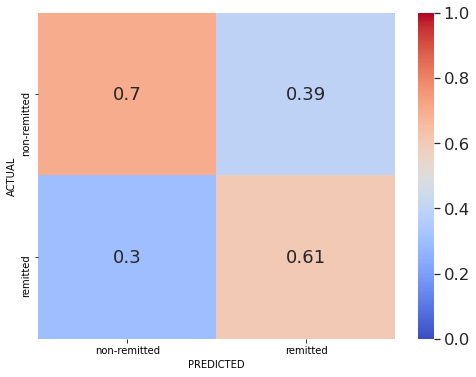

In [34]:
#Plot confusion matrix
import seaborn as sns
plt.figure(figsize = (8,6))
ax = plt.axes()
sns.set(font_scale=1.5)
sns.set_style("white")
sns.heatmap(cm, 
            annot=True,
            vmin=0,
            vmax=1,
            cmap='coolwarm',
            xticklabels=['non-remitted', 'remitted'], 
            yticklabels=['non-remitted', 'remitted'])
ax.set(xlabel='PREDICTED', ylabel = 'ACTUAL')

### Plot ROC curve

<Figure size 432x288 with 0 Axes>

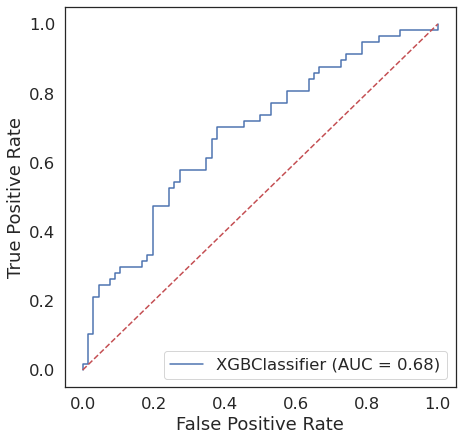

In [35]:
from sklearn.metrics import plot_roc_curve
plt.clf()
plt.figure(figsize=(7,7))
axes = plt.axes()
plot_roc_curve(best_estimator, X_test, y_test, ax=axes)  
plt.plot([0,1],[0,1],'r--') 

In [37]:
roc_auc_score(y_test, y_scores)

0.6815523657628921

In [37]:
from sklearn.metrics import f1_score, accuracy_score, balanced_accuracy_score, recall_score, precision_score, auc

print("Precision: {}".format(precision_score(y_test,y_pred).round(2)))
print("Recall: {}".format(recall_score(y_test,y_pred).round(2)))
print("F1 Score: {}".format(f1_score(y_test,y_pred).round(2)))
print("Accuracy: {}".format(accuracy_score(y_test,y_pred).round(2)))
print("Balanced accuracy: {}".format(balanced_accuracy_score(y_test,y_pred).round(2)))

Precision: 0.61
Recall: 0.7
F1 Score: 0.65
Accuracy: 0.65
Balanced accuracy: 0.65


### Model explanation

In [42]:
import shap
import statistics
# non-remitted = 0, remitted = 1

In [43]:
# explain the model's predictions using SHAP
explainer = shap.Explainer(best_estimator)
shap_values = explainer(X_train)

In [44]:
# dataframe of shapley values per case per analyte
shap_df = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)

In [45]:
# average absolute shap value per analyte
avg_shap_abs = shap_df.apply(lambda x: statistics.mean(abs(x)),axis=0)
avg_shap_abs = avg_shap_abs.sort_values(ascending=False)
avg_shap_abs = pd.DataFrame(avg_shap_abs, columns=["Avg Absolute Shapley Value"])
avg_shap_abs.reset_index(inplace=True)
avg_shap_abs = avg_shap_abs.rename(columns = {'index':'Protein'})
avg_shap_abs['Protein'] = avg_shap_abs['Protein'].apply(lambda x: x[2:])
avg_shap_abs

,Protein,Avg Absolute Shapley Value
0,Fact7,0.631633
1,TFF3,0.615382
2,CD5L,0.597143
3,TM,0.593515
4,MIG,0.523111
...,...,...
227,IL1b,0.000000
228,IFNg,0.000000
229,HCG,0.000000
230,HSP60,0.000000


In [46]:
#write to file
avg_shap_abs.to_csv("scripts/VM/Python/output/avg_shap_abs_VM.csv")

In [47]:
# average shap value per analyte, keeping 'direction'
avg_shap = shap_df.apply(lambda x: statistics.mean(x),axis=0)
avg_shap = avg_shap.reindex(avg_shap.abs().sort_values(ascending=False).index)
avg_shap = pd.DataFrame(avg_shap, columns=["Average Shapley Value"])
avg_shap.reset_index(inplace=True)
avg_shap = avg_shap.rename(columns = {'index':'Protein'})
avg_shap['Protein'] = avg_shap['Protein'].apply(lambda x: x[2:])
avg_shap

,Protein,Average Shapley Value
0,Fact7,0.018805
1,VEGF,0.017107
2,AAT,-0.016895
3,STF,0.015420
4,TSP1,0.014592
...,...,...
227,IL1b,0.000000
228,IFNg,0.000000
229,HCG,0.000000
230,HSP60,0.000000


In [48]:
#write to file
avg_shap.to_csv("scripts/VM/Python/output/avg_shap_direction_VM.csv")

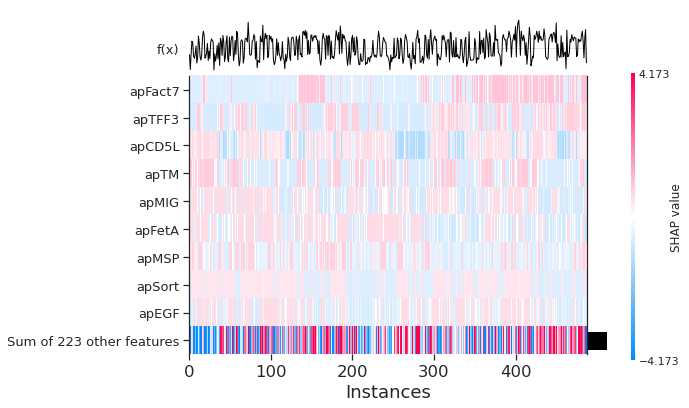

In [49]:
# visualize shap values for each analyte across instances
shap.initjs()
shap.plots.heatmap(shap_values, max_display=10)

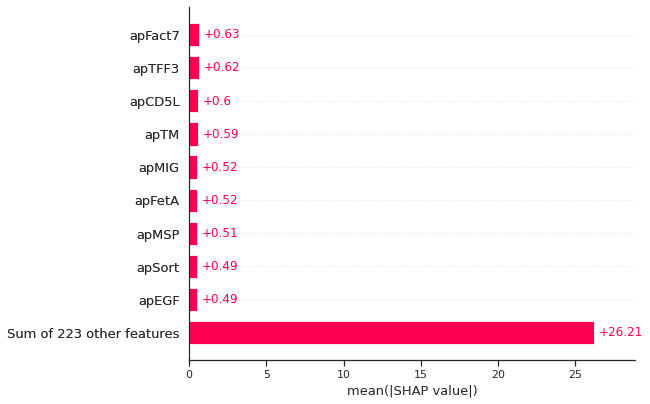

In [50]:
# visualize top 10 proteins with highest mean absolute shap values
shap.initjs()
shap.plots.bar(shap_values, max_display=10)

In [51]:
# visualize all prediction's explanation
shap.initjs()
shap.plots.force(explainer.expected_value, shap_values.values, features=X_train, feature_names=X_names)

In [52]:
# visualize the first prediction's explanation
shap.initjs()
shap.plots.force(shap_values[0],feature_names=X_names)

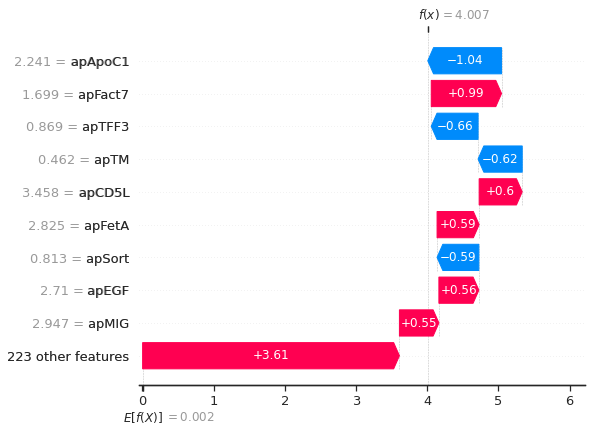

In [53]:
# visualize the first prediction's explanation as waterfall plot
shap.initjs()
shap.plots.waterfall(shap_values[0], max_display=10)

### Alternatively, build exact explainer using masker

In [54]:
# build a clustering of the features based on shared information about y
clustering = shap.utils.hclust(X_train, y_train)

 34%|███▍      | 80/232 [01:10<02:26,  1.04it/s]No/low signal found from feature 79 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 80 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
 97%|█████████▋| 225/232 [03:12<00:06,  1.14it/s]No/low signal found from feature 224 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
233it [03:18,  1.12it/s]                         


In [ ]:
# above we implicitly used shap.maskers.Independent by passing a raw dataframe as the masker
# now we explicitly use a Partition masker that uses the clustering we just computed
masker = shap.maskers.Partition(X_train, clustering=clustering)

# build an Exact explainer and explain the model predictions on the given dataset
explainer = shap.explainers.Exact(best_estimator.predict_proba, masker)
shap_values2 = explainer(X_train[:232])

# get just the explanations for the positive class
shap_values2 = shap_values2[...,1]

In [ ]:
shap_values2